<a href="https://colab.research.google.com/github/sjang1594/3dgs-experiments/blob/main/3DGaussianSplat.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
# Connect Google Drive
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [5]:
# Check CUDA / Pytorch / Graphics Card Info
!nvcc --version
import torch
print(f"PyTorch: {torch.__version__}")
print(f"CUDA available: {torch.cuda.is_available()}")
print(f"CUDA version: {torch.version.cuda}")

!nvidia-smi

nvcc: NVIDIA (R) Cuda compiler driver
Copyright (c) 2005-2025 NVIDIA Corporation
Built on Fri_Feb_21_20:23:50_PST_2025
Cuda compilation tools, release 12.8, V12.8.93
Build cuda_12.8.r12.8/compiler.35583870_0
PyTorch: 2.9.0+cu128
CUDA available: True
CUDA version: 12.8
Thu Feb 19 13:27:49 2026       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 580.82.07              Driver Version: 580.82.07      CUDA Version: 13.0     |
+-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  NVIDIA A100-SXM4-80GB          Off |   00000000:

In [3]:
# This is only for the Google Colab
# You should download this if you'd like to run this in local machine
!git clone https://github.com/graphdeco-inria/gaussian-splatting.git --recursive
%cd gaussian-splatting
# Dependencies
!pip install plyfile tqdm submodules/diff-gaussian-rasterization submodules/simple-knn

Cloning into 'gaussian-splatting'...
remote: Enumerating objects: 1053, done.
remote: Total 1053 (delta 0), reused 0 (delta 0), pack-reused 1053 (from 1)
Receiving objects: 100% (1053/1053), 78.71 MiB | 19.02 MiB/s, done.
Resolving deltas: 100% (593/593), done.
Submodule 'SIBR_viewers' (https://gitlab.inria.fr/sibr/sibr_core.git) registered for path 'SIBR_viewers'
Submodule 'submodules/diff-gaussian-rasterization' (https://github.com/graphdeco-inria/diff-gaussian-rasterization.git) registered for path 'submodules/diff-gaussian-rasterization'
Submodule 'submodules/fused-ssim' (https://github.com/rahul-goel/fused-ssim.git) registered for path 'submodules/fused-ssim'
Submodule 'submodules/simple-knn' (https://gitlab.inria.fr/bkerbl/simple-knn.git) registered for path 'submodules/simple-knn'
Cloning into '/content/gaussian-splatting/SIBR_viewers'...
remote: Enumerating objects: 3293, done.        
remote: Counting objects: 100% (322/322), done.        
remote: Compressing objects: 100% (17

In [4]:
# This is for the small datasets
!grep -i "dataset\|download\|360\|mipnerf\|tandt\|truck\|train" README.md | head -30
!wget https://repo-sam.inria.fr/fungraph/3d-gaussian-splatting/datasets/input/tandt_db.zip -O /content/tandt_db.zip
!unzip /content/tandt_db.zip -d /content/gaussian-splatting/data/
!ls data/

| [T&T+DB COLMAP (650MB)](https://repo-sam.inria.fr/fungraph/3d-gaussian-splatting/datasets/input/tandt_db.zip) | [Pre-trained Models (14 GB)](https://repo-sam.inria.fr/fungraph/3d-gaussian-splatting/datasets/pretrained/models.zip) | [Viewers for Windows (60MB)](https://repo-sam.inria.fr/fungraph/3d-gaussian-splatting/binaries/viewers.zip) | [Evaluation Images (7 GB)](https://repo-sam.inria.fr/fungraph/3d-gaussian-splatting/evaluation/images.zip) |<br>
This repository contains the official authors implementation associated with the paper "3D Gaussian Splatting for Real-Time Radiance Field Rendering", which can be found [here](https://repo-sam.inria.fr/fungraph/3d-gaussian-splatting/). We further provide the reference images used to create the error metrics reported in the paper, as well as recently created, pre-trained models. 
Abstract: *Radiance Field methods have recently revolutionized novel-view synthesis of scenes captured with multiple photos or videos. However, achieving high v

In [ ]:
# Trail Small Dataset First
!python train.py -s data/tandt/train --eval --model_path /content/drive/MyDrive/3dgs_output/train

2026-02-11 14:21:19.944935: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2026-02-11 14:21:19.965071: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1770819679.988175    9351 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1770819679.995749    9351 cuda_blas.cc:1407] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
W0000 00:00:1770819680.015199    9351 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking 

In [ ]:
!python render.py -m /content/drive/MyDrive/3dgs_output/train

Looking for config file in /content/drive/MyDrive/3dgs_output/garden/cfg_args
Config file found: /content/drive/MyDrive/3dgs_output/garden/cfg_args
Rendering /content/drive/MyDrive/3dgs_output/garden
Loading trained model at iteration 30000 [11/02 14:36:24]
------------LLFF HOLD------------- [11/02 14:36:26]
Reading camera 301/301 [11/02 14:36:26]
Loading Training Cameras [11/02 14:36:26]
Loading Test Cameras [11/02 14:36:29]
Rendering progress: 100% 263/263 [02:01<00:00,  2.16it/s]
Rendering progress: 100% 38/38 [00:17<00:00,  2.14it/s]


In [ ]:
!python metrics.py -m /content/drive/MyDrive/3dgs_output/train


Scene: /content/drive/MyDrive/3dgs_output/garden
Method: ours_30000
Metric evaluation progress:   0% 0/38 [00:00<?, ?it/s]Downloading: "https://download.pytorch.org/models/vgg16-397923af.pth" to /root/.cache/torch/hub/checkpoints/vgg16-397923af.pth

  0% 0.00/528M [00:00<?, ?B/s]
  4% 19.2M/528M [00:00<00:02, 201MB/s]
  8% 42.6M/528M [00:00<00:02, 227MB/s]
 13% 66.0M/528M [00:00<00:02, 235MB/s]
 17% 89.2M/528M [00:00<00:01, 238MB/s]
 21% 112M/528M [00:00<00:01, 239MB/s] 
 26% 135M/528M [00:00<00:01, 240MB/s]
 30% 158M/528M [00:00<00:01, 241MB/s]
 34% 182M/528M [00:00<00:01, 242MB/s]
 39% 205M/528M [00:00<00:01, 242MB/s]
 43% 228M/528M [00:01<00:01, 243MB/s]
 48% 252M/528M [00:01<00:01, 242MB/s]
 52% 275M/528M [00:01<00:01, 243MB/s]
 57% 298M/528M [00:01<00:00, 243MB/s]
 61% 322M/528M [00:01<00:00, 243MB/s]
 65% 345M/528M [00:01<00:00, 240MB/s]
 70% 368M/528M [00:01<00:00, 240MB/s]
 74% 391M/528M [00:01<00:00, 241MB/s]
 79% 414M/528M [00:01<00:00, 241MB/s]
 83% 438M/528M [00:01<00:00, 

In [6]:
!pip install plyfile
import plyfile

def count_gaussians(path):
  ply = plyfile.PlyData.read(path)
  return len(ply['vertex'])

In [7]:
# Get the Large Dataset from Google
!wget http://storage.googleapis.com/gresearch/refraw360/360_v2.zip

--2026-02-19 13:30:33--  http://storage.googleapis.com/gresearch/refraw360/360_v2.zip
Resolving storage.googleapis.com (storage.googleapis.com)... 172.217.194.207, 142.250.4.207, 172.253.144.207, ...
Connecting to storage.googleapis.com (storage.googleapis.com)|172.217.194.207|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 12535427936 (12G) [application/zip]
Saving to: ‘360_v2.zip’

360_v2.zip          100%[===================>]  11.67G  23.7MB/s    in 8m 55s  

2026-02-19 13:39:29 (22.3 MB/s) - ‘360_v2.zip’ saved [12535427936/12535427936]



In [8]:
%cd gaussian-splatting
!mkdir data
!unzip 360_v2.zip -d data/mipnerf360

Streaming output truncated to the last 5000 lines.
  inflating: data/mipnerf360/bonsai/images_4/DSCF5773.JPG  
  inflating: data/mipnerf360/bonsai/images_4/DSCF5774.JPG  
  inflating: data/mipnerf360/bonsai/images_4/DSCF5775.JPG  
  inflating: data/mipnerf360/bonsai/images_4/DSCF5776.JPG  
  inflating: data/mipnerf360/bonsai/images_4/DSCF5777.JPG  
  inflating: data/mipnerf360/bonsai/images_4/DSCF5778.JPG  
  inflating: data/mipnerf360/bonsai/images_4/DSCF5779.JPG  
  inflating: data/mipnerf360/bonsai/images_4/DSCF5780.JPG  
  inflating: data/mipnerf360/bonsai/images_4/DSCF5781.JPG  
  inflating: data/mipnerf360/bonsai/images_4/DSCF5782.JPG  
  inflating: data/mipnerf360/bonsai/images_4/DSCF5783.JPG  
  inflating: data/mipnerf360/bonsai/images_4/DSCF5784.JPG  
  inflating: data/mipnerf360/bonsai/images_4/DSCF5785.JPG  
  inflating: data/mipnerf360/bonsai/images_4/DSCF5786.JPG  
  inflating: data/mipnerf360/bonsai/images_4/DSCF5787.JPG  
  inflating: data/mipnerf360/bonsai/images_4/DSCF

In [ ]:
### sh_degree

In [ ]:
!python train.py -s data/mipnerf360/kitchen --eval --sh_degree 3 -m /content/drive/MyDrive/3dgs_output/kitchen/sh3

2026-02-18 12:52:25.503962: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2026-02-18 12:52:25.522714: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1771419145.545018   18207 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1771419145.552344   18207 cuda_blas.cc:1407] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
W0000 00:00:1771419145.571559   18207 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking 

In [ ]:
!python render.py -m /content/drive/MyDrive/3dgs_output/kitchen/sh3

Looking for config file in /content/drive/MyDrive/3dgs_output/kitchen/sh3/cfg_args
Config file found: /content/drive/MyDrive/3dgs_output/kitchen/sh3/cfg_args
Rendering /content/drive/MyDrive/3dgs_output/kitchen/sh3
Loading trained model at iteration 30000 [18/02 13:24:23]
------------LLFF HOLD------------- [18/02 13:24:25]
Reading camera 279/279 [18/02 13:24:25]
Loading Training Cameras [18/02 13:24:25]
[ INFO ] Encountered quite large input images (>1.6K pixels width), rescaling to 1.6K.
 If this is not desired, please explicitly specify '--resolution/-r' as 1 [18/02 13:24:25]
Loading Test Cameras [18/02 13:25:08]
Rendering progress: 100% 244/244 [06:28<00:00,  1.59s/it]
Rendering progress: 100% 35/35 [00:55<00:00,  1.60s/it]


In [ ]:
!python metrics.py -m /content/drive/MyDrive/3dgs_output/kitchen/sh3


Scene: /content/drive/MyDrive/3dgs_output/kitchen/sh3
Method: ours_30000
Metric evaluation progress:   0% 0/35 [00:00<?, ?it/s]Downloading: "https://download.pytorch.org/models/vgg16-397923af.pth" to /root/.cache/torch/hub/checkpoints/vgg16-397923af.pth

  0% 0.00/528M [00:00<?, ?B/s]
  1% 3.50M/528M [00:00<00:15, 35.9MB/s]
  1% 7.25M/528M [00:00<00:14, 37.5MB/s]
  6% 29.1M/528M [00:00<00:04, 124MB/s] 
 10% 51.8M/528M [00:00<00:02, 168MB/s]
 14% 74.2M/528M [00:00<00:02, 192MB/s]
 18% 96.6M/528M [00:00<00:02, 206MB/s]
 23% 119M/528M [00:00<00:01, 215MB/s] 
 27% 141M/528M [00:00<00:01, 221MB/s]
 31% 164M/528M [00:00<00:01, 225MB/s]
 35% 186M/528M [00:01<00:01, 227MB/s]
 39% 208M/528M [00:01<00:01, 229MB/s]
 44% 231M/528M [00:01<00:01, 231MB/s]
 48% 253M/528M [00:01<00:01, 232MB/s]
 52% 275M/528M [00:01<00:01, 232MB/s]
 56% 298M/528M [00:01<00:01, 233MB/s]
 61% 320M/528M [00:01<00:00, 233MB/s]
 65% 342M/528M [00:01<00:00, 233MB/s]
 69% 365M/528M [00:01<00:00, 233MB/s]
 73% 387M/528M [00:

In [ ]:
!python train.py -s data/mipnerf360/kitchen --eval --sh_degree 0 -m /content/drive/MyDrive/3dgs_output/kitchen/sh0

2026-02-18 13:33:49.363626: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2026-02-18 13:33:49.382992: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1771421629.406815   28984 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1771421629.414545   28984 cuda_blas.cc:1407] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
W0000 00:00:1771421629.434831   28984 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking 

In [ ]:
!python render.py -m /content/drive/MyDrive/3dgs_output/kitchen/sh0

Looking for config file in /content/drive/MyDrive/3dgs_output/kitchen/sh0/cfg_args
Config file found: /content/drive/MyDrive/3dgs_output/kitchen/sh0/cfg_args
Rendering /content/drive/MyDrive/3dgs_output/kitchen/sh0
Loading trained model at iteration 30000 [18/02 14:04:25]
------------LLFF HOLD------------- [18/02 14:04:27]
Reading camera 279/279 [18/02 14:04:27]
Loading Training Cameras [18/02 14:04:27]
[ INFO ] Encountered quite large input images (>1.6K pixels width), rescaling to 1.6K.
 If this is not desired, please explicitly specify '--resolution/-r' as 1 [18/02 14:04:27]
Loading Test Cameras [18/02 14:05:11]
Rendering progress: 100% 244/244 [06:32<00:00,  1.61s/it]
Rendering progress: 100% 35/35 [00:56<00:00,  1.62s/it]


In [ ]:
!python metrics.py -m /content/drive/MyDrive/3dgs_output/kitchen/sh0


Scene: /content/drive/MyDrive/3dgs_output/kitchen/sh0
Method: ours_30000
Metric evaluation progress: 100% 35/35 [00:50<00:00,  1.45s/it]
  SSIM :    0.9244097
  PSNR :   30.6005344
  LPIPS:    0.1243820



In [ ]:
!python train.py -s data/mipnerf360/kitchen --eval --sh_degree 1 -m /content/drive/MyDrive/3dgs_output/kitchen/sh1

2026-02-18 14:13:51.918426: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2026-02-18 14:13:51.938025: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1771424031.963928   39293 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1771424031.971925   39293 cuda_blas.cc:1407] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
W0000 00:00:1771424031.992498   39293 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking 

In [ ]:
!python render.py -m /content/drive/MyDrive/3dgs_output/kitchen/sh1

Looking for config file in /content/drive/MyDrive/3dgs_output/kitchen/sh1/cfg_args
Config file found: /content/drive/MyDrive/3dgs_output/kitchen/sh1/cfg_args
Rendering /content/drive/MyDrive/3dgs_output/kitchen/sh1
Loading trained model at iteration 30000 [18/02 14:44:17]
------------LLFF HOLD------------- [18/02 14:44:19]
Reading camera 279/279 [18/02 14:44:19]
Loading Training Cameras [18/02 14:44:19]
[ INFO ] Encountered quite large input images (>1.6K pixels width), rescaling to 1.6K.
 If this is not desired, please explicitly specify '--resolution/-r' as 1 [18/02 14:44:19]
Loading Test Cameras [18/02 14:45:02]
Rendering progress: 100% 244/244 [06:41<00:00,  1.65s/it]
Rendering progress: 100% 35/35 [00:57<00:00,  1.65s/it]


In [ ]:
!python metrics.py -m /content/drive/MyDrive/3dgs_output/kitchen/sh1


Scene: /content/drive/MyDrive/3dgs_output/kitchen/sh1
Method: ours_30000
Metric evaluation progress: 100% 35/35 [00:50<00:00,  1.45s/it]
  SSIM :    0.9281715
  PSNR :   31.0590820
  LPIPS:    0.1205885



In [ ]:
!python train.py -s data/mipnerf360/kitchen --eval --sh_degree 2 -m /content/drive/MyDrive/3dgs_output/kitchen/sh2

2026-02-18 14:53:54.779267: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2026-02-18 14:53:54.798641: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1771426434.821981   49410 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1771426434.829719   49410 cuda_blas.cc:1407] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
W0000 00:00:1771426434.849766   49410 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking 

In [ ]:
!python render.py -m /content/drive/MyDrive/3dgs_output/kitchen/sh2

Looking for config file in /content/drive/MyDrive/3dgs_output/kitchen/sh2/cfg_args
Config file found: /content/drive/MyDrive/3dgs_output/kitchen/sh2/cfg_args
Rendering /content/drive/MyDrive/3dgs_output/kitchen/sh2
Loading trained model at iteration 30000 [18/02 15:24:30]
------------LLFF HOLD------------- [18/02 15:24:32]
Reading camera 279/279 [18/02 15:24:32]
Loading Training Cameras [18/02 15:24:32]
[ INFO ] Encountered quite large input images (>1.6K pixels width), rescaling to 1.6K.
 If this is not desired, please explicitly specify '--resolution/-r' as 1 [18/02 15:24:32]
Loading Test Cameras [18/02 15:25:15]
Rendering progress: 100% 244/244 [06:27<00:00,  1.59s/it]
Rendering progress: 100% 35/35 [00:55<00:00,  1.59s/it]


In [ ]:
!python metrics.py -m /content/drive/MyDrive/3dgs_output/kitchen/sh2


Scene: /content/drive/MyDrive/3dgs_output/kitchen/sh2
Method: ours_30000
Metric evaluation progress: 100% 35/35 [00:47<00:00,  1.37s/it]
  SSIM :    0.9311565
  PSNR :   31.2686272
  LPIPS:    0.1176810



Saved: /content/drive/MyDrive/3dgs_output/kitchen/sh_comparison_idx18.png


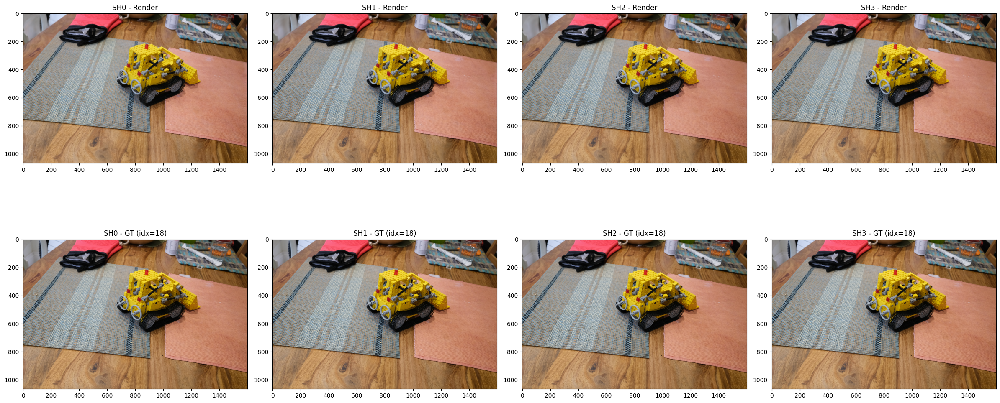

Saved: /content/drive/MyDrive/3dgs_output/kitchen/sh_comparison_idx20.png


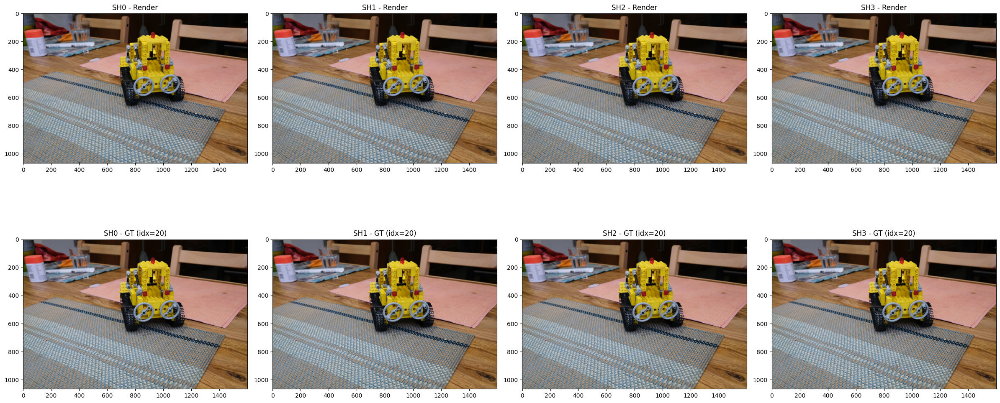

Saved: /content/drive/MyDrive/3dgs_output/kitchen/sh_comparison_idx23.png


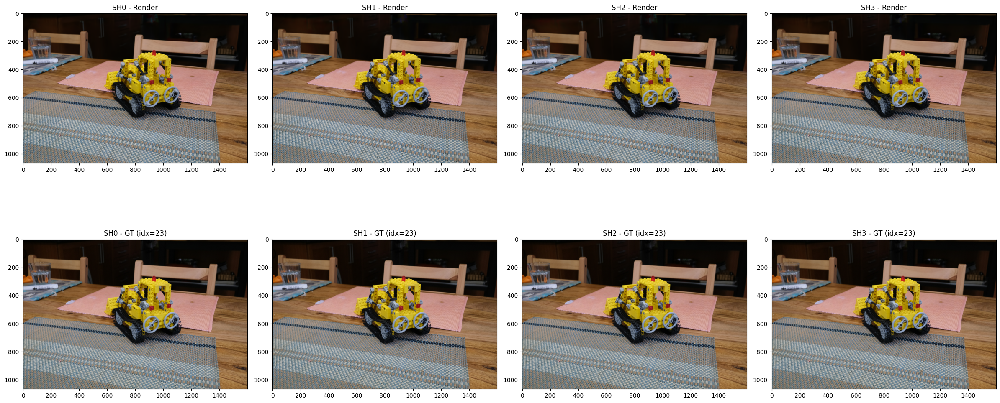

In [51]:
import matplotlib.pyplot as plt
from PIL import Image
import os

def compare_sh(base, iteration, idx=0):
    degrees = [0, 1, 2, 3]
    fig, axes = plt.subplots(2, 4, figsize=(24, 12))

    for i, deg in enumerate(degrees):
        model_path = f"{base}/sh{deg}"
        render_dir = f"{model_path}/test/ours_{iteration}/renders"
        gt_dir = f"{model_path}/test/ours_{iteration}/gt"

        renders = sorted(os.listdir(render_dir))
        gts = sorted(os.listdir(gt_dir))

        axes[0][i].imshow(Image.open(f"{render_dir}/{renders[idx]}"))
        axes[0][i].set_title(f"SH{deg} - Render")
        axes[1][i].imshow(Image.open(f"{gt_dir}/{gts[idx]}"))
        axes[1][i].set_title(f"SH{deg} - GT (idx={idx})")

    plt.tight_layout()

    save_path = f"/content/drive/MyDrive/3dgs_output/kitchen/sh_comparison_idx{idx:02d}.png"
    plt.savefig(save_path, dpi=150, bbox_inches='tight')
    print(f"Saved: {save_path}")
    plt.show()

base = "/content/drive/MyDrive/3dgs_output/kitchen"
for idx in [18, 20, 23]:
    compare_sh(base, 30000, idx)

### Comparison for Spherical Harmonics (SH) Degree Test
- This describes how color changes when different camera angle is given.
- ex 1.: If we look at stainless / metalic objects in specific direction, it looks like it's gray, but if we look at the object with same direction of light, we can see that lights are reflecting.
- ex 2.: Since there are some reflection on glass, the color changes when viewing direction is varied.

### Configuration
- Degree0
- Iteration: 7K / 30K
- Namespace(sh_degree=0, source_path='/content/gaussian-splatting/data/mipnerf360/kitchen', model_path='/content/drive/MyDrive/3dgs_output/kitchen/sh0', images='images', depths='', resolution=-1, white_background=False, train_test_exp=False, data_device='cuda', eval=True)

- Degree1
- Iteration: 7K / 30K
- Namespace(sh_degree=1, source_path='/content/gaussian-splatting/data/mipnerf360/kitchen', model_path='/content/drive/MyDrive/3dgs_output/kitchen/sh1', images='images', depths='', resolution=-1, white_background=False, train_test_exp=False, data_device='cuda', eval=True)

- Degree2
- Iteration: 7K / 30K
- Args: Namespace(sh_degree=2, source_path='/content/gaussian-splatting/data/mipnerf360/kitchen', model_path='/content/drive/MyDrive/3dgs_output/kitchen/sh2', images='images', depths='', resolution=-1, white_background=False, train_test_exp=False, data_device='cuda', eval=True)

- Degree3
- Iteration: 7K / 30K
- Args: Namespace(sh_degree=3, source_path='/content/gaussian-splatting/data/mipnerf360/kitchen', model_path='/content/drive/MyDrive/3dgs_output/kitchen/sh3', images='images', depths='', resolution=-1, white_background=False, train_test_exp=False, data_device='cuda', eval=True)

### Metric Description

### Results
| Degree | Spherical Harmonics Coeff | SSIM | PNSR | LPIPS
|----------|----------|----------|----------|----------|
| 0    | 1    | 0.9244097 | 30.6005344 | 0.1243820 |
| 1    | 4    | 0.9281715 | 31.0590820 | 0.1205885 |
| 2    | 9    | 0.9311565 | 31.2686272 | 0.1176810 |
| 3    | 16   | 0.9326434 | 31.5447502 | 0.1158840 |

In [ ]:
# 2. bicycle — thin geometry => densify_grad_threshold Test
!python train.py -s data/mipnerf360/bicycle --eval -m /content/drive/MyDrive/3dgs_output/bicycle/base

2026-02-18 15:33:48.112805: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2026-02-18 15:33:48.132108: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1771428828.155249   59933 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1771428828.162827   59933 cuda_blas.cc:1407] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
W0000 00:00:1771428828.182962   59933 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking 

In [ ]:
!python render.py -m /content/drive/MyDrive/3dgs_output/bicycle/base

Looking for config file in /content/drive/MyDrive/3dgs_output/bicycle/base/cfg_args
Config file found: /content/drive/MyDrive/3dgs_output/bicycle/base/cfg_args
Rendering /content/drive/MyDrive/3dgs_output/bicycle/base
Loading trained model at iteration 30000 [18/02 16:19:56]
------------LLFF HOLD------------- [18/02 16:19:57]
Reading camera 194/194 [18/02 16:19:57]
Loading Training Cameras [18/02 16:19:57]
[ INFO ] Encountered quite large input images (>1.6K pixels width), rescaling to 1.6K.
 If this is not desired, please explicitly specify '--resolution/-r' as 1 [18/02 16:19:57]
Loading Test Cameras [18/02 16:20:59]
Rendering progress: 100% 169/169 [03:57<00:00,  1.40s/it]
Rendering progress: 100% 25/25 [00:36<00:00,  1.46s/it]


In [ ]:
!python metrics.py -m /content/drive/MyDrive/3dgs_output/bicycle/base


Scene: /content/drive/MyDrive/3dgs_output/bicycle/base
Method: ours_30000
Metric evaluation progress: 100% 25/25 [00:35<00:00,  1.42s/it]
  SSIM :    0.7473353
  PSNR :   25.1360970
  LPIPS:    0.2421628



In [ ]:
# baseline (default = 0.0002)
!python train.py -s data/mipnerf360/bicycle --eval --densify_grad_threshold 0.0002 -m /content/drive/MyDrive/3dgs_output/bicycle/dense_med

2026-02-18 16:26:39.735875: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2026-02-18 16:26:39.755441: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1771431999.778550   73723 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1771431999.786138   73723 cuda_blas.cc:1407] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
W0000 00:00:1771431999.806409   73723 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking 

In [ ]:
!python gaussian-splatting/render.py -m /content/drive/MyDrive/3dgs_output/bicycle/dense_med

Looking for config file in /content/drive/MyDrive/3dgs_output/bicycle/dense_med/cfg_args
Config file found: /content/drive/MyDrive/3dgs_output/bicycle/dense_med/cfg_args
Rendering /content/drive/MyDrive/3dgs_output/bicycle/dense_med
Loading trained model at iteration 30000 [18/02 17:03:13]
------------LLFF HOLD------------- [18/02 17:03:14]
Reading camera 194/194 [18/02 17:03:14]
Loading Training Cameras [18/02 17:03:14]
[ INFO ] Encountered quite large input images (>1.6K pixels width), rescaling to 1.6K.
 If this is not desired, please explicitly specify '--resolution/-r' as 1 [18/02 17:03:14]
Loading Test Cameras [18/02 17:04:16]
Rendering progress: 100% 169/169 [03:58<00:00,  1.41s/it]
Rendering progress: 100% 25/25 [00:36<00:00,  1.46s/it]


In [ ]:
!python gaussian-splatting/metrics.py -m /content/drive/MyDrive/3dgs_output/bicycle/dense_med


Scene: /content/drive/MyDrive/3dgs_output/bicycle/dense_med
Method: ours_30000
Metric evaluation progress: 100% 25/25 [00:35<00:00,  1.43s/it]
  SSIM :    0.7472895
  PSNR :   25.1435165
  LPIPS:    0.2422213



In [59]:
# More Gaussian → VRAM ↑, Detail ↑
!python train.py -s data/mipnerf360/bicycle --eval --densify_grad_threshold 0.0001 -m /content/drive/MyDrive/3dgs_output/bicycle/dense_low

2026-02-19 15:16:48.053325: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2026-02-19 15:16:48.072479: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1771514208.096739   50901 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1771514208.104760   50901 cuda_blas.cc:1407] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
W0000 00:00:1771514208.125164   50901 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking 

In [60]:
!python gaussian-splatting/render.py -m /content/drive/MyDrive/3dgs_output/bicycle/dense_low

python3: can't open file '/content/gaussian-splatting/gaussian-splatting/render.py': [Errno 2] No such file or directory


In [61]:
!python metrics.py -m /content/drive/MyDrive/3dgs_output/bicycle/dense_low


Scene: /content/drive/MyDrive/3dgs_output/bicycle/dense_low
Method: ours_30000
Metric evaluation progress: 100% 25/25 [00:36<00:00,  1.44s/it]
  SSIM :    0.7719774
  PSNR :   25.3083401
  LPIPS:    0.1857106



In [ ]:
# Less Gaussian → VRAM ↓, Fast, Detail ↓
!python train.py -s data/mipnerf360/bicycle --eval --densify_grad_threshold 0.0005 -m /content/drive/MyDrive/3dgs_output/bicycle/dense_high

2026-02-18 18:23:54.548952: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2026-02-18 18:23:54.568418: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1771439034.591962  104953 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1771439034.599698  104953 cuda_blas.cc:1407] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
W0000 00:00:1771439034.619595  104953 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking 

In [ ]:
!python render.py -m /content/drive/MyDrive/3dgs_output/bicycle/dense_high

Looking for config file in /content/drive/MyDrive/3dgs_output/bicycle/dense_high/cfg_args
Config file found: /content/drive/MyDrive/3dgs_output/bicycle/dense_high/cfg_args
Rendering /content/drive/MyDrive/3dgs_output/bicycle/dense_high
Loading trained model at iteration 30000 [18/02 18:44:49]
------------LLFF HOLD------------- [18/02 18:44:50]
Reading camera 194/194 [18/02 18:44:50]
Loading Training Cameras [18/02 18:44:50]
[ INFO ] Encountered quite large input images (>1.6K pixels width), rescaling to 1.6K.
 If this is not desired, please explicitly specify '--resolution/-r' as 1 [18/02 18:44:50]
Loading Test Cameras [18/02 18:45:51]
Rendering progress: 100% 169/169 [03:46<00:00,  1.34s/it]
Rendering progress: 100% 25/25 [00:35<00:00,  1.41s/it]


In [ ]:
!python metrics.py -m /content/drive/MyDrive/3dgs_output/bicycle/dense_high


Scene: /content/drive/MyDrive/3dgs_output/bicycle/dense_high
Method: ours_30000
Metric evaluation progress: 100% 25/25 [00:35<00:00,  1.43s/it]
  SSIM :    0.6516691
  PSNR :   24.1706982
  LPIPS:    0.3792148



Saved: /content/drive/MyDrive/3dgs_output/bicycle/dense_comparison_idx00.png


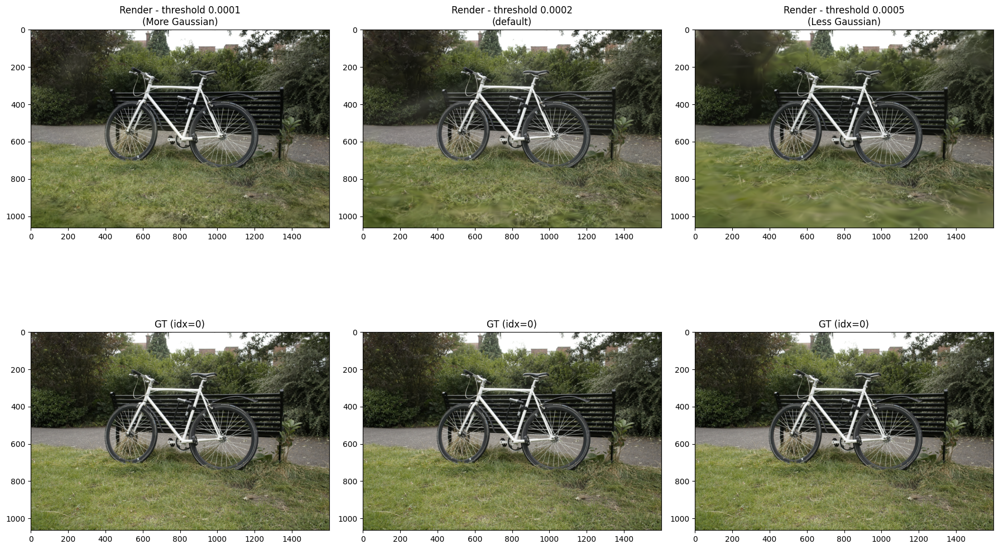

Saved: /content/drive/MyDrive/3dgs_output/bicycle/dense_comparison_idx01.png


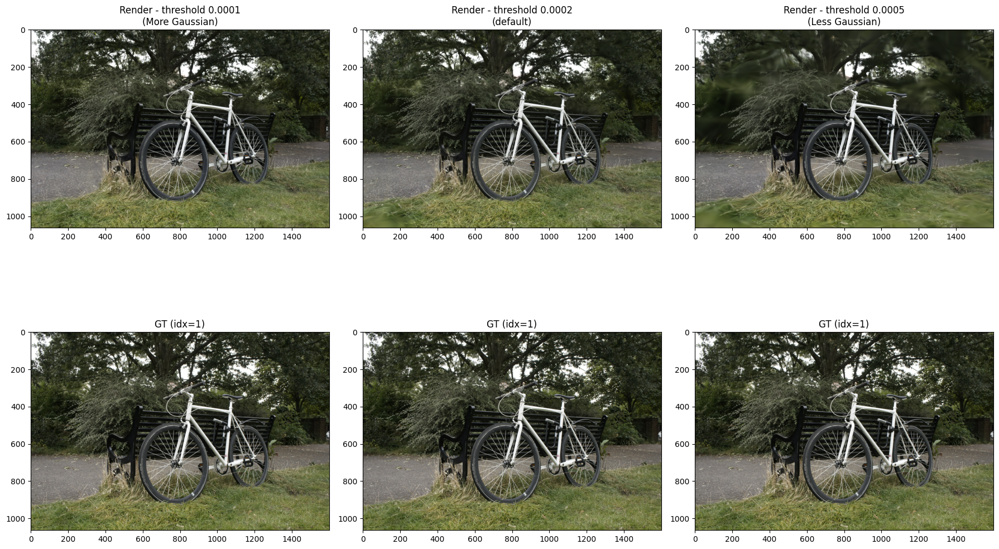

Saved: /content/drive/MyDrive/3dgs_output/bicycle/dense_comparison_idx02.png


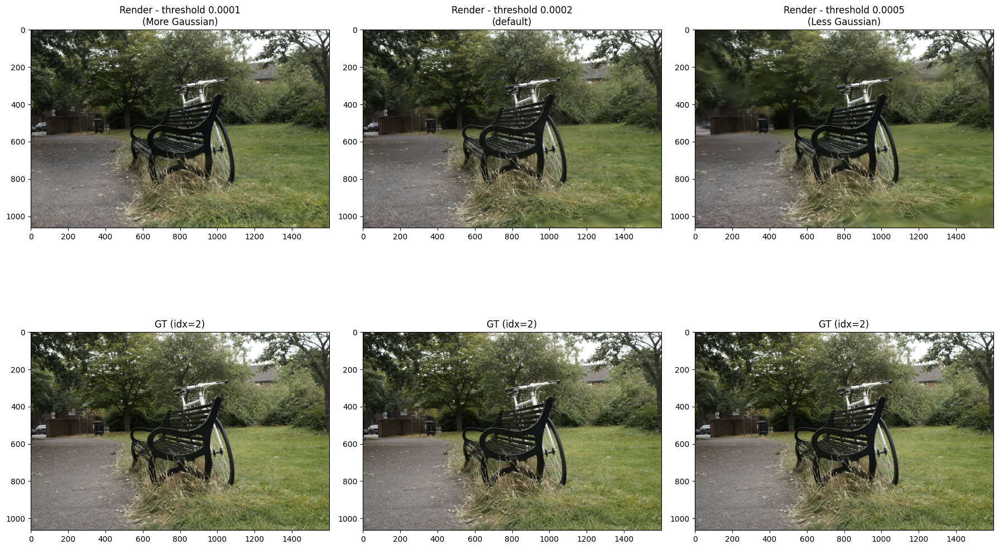

In [71]:
def compare_dense(base, iteration, idx=0):
    configs = ["dense_low", "dense_med", "dense_high"]
    labels  = ["threshold 0.0001\n(More Gaussian)",
               "threshold 0.0002\n(default)",
               "threshold 0.0005\n(Less Gaussian)"]

    fig, axes = plt.subplots(2, 3, figsize=(18, 12))

    for i, (cfg, label) in enumerate(zip(configs, labels)):
        model_path = f"{base}/{cfg}"
        render_dir = f"{model_path}/test/ours_{iteration}/renders"
        gt_dir     = f"{model_path}/test/ours_{iteration}/gt"

        renders = sorted(os.listdir(render_dir))
        gts     = sorted(os.listdir(gt_dir))

        axes[0][i].imshow(Image.open(f"{render_dir}/{renders[idx]}"))
        axes[0][i].set_title(f"Render - {label}")
        axes[1][i].imshow(Image.open(f"{gt_dir}/{gts[idx]}"))
        axes[1][i].set_title(f"GT (idx={idx})")

    plt.tight_layout()
    save_path = f"/content/drive/MyDrive/3dgs_output/bicycle/dense_comparison_idx{idx:02d}.png"
    plt.savefig(save_path, dpi=150, bbox_inches='tight')
    print(f"Saved: {save_path}")
    plt.show()

base = "/content/drive/MyDrive/3dgs_output/bicycle"
for idx in [0, 1, 2]:
    compare_dense(base, 30000, idx)

### Densify Grad Threashold (Bicycle)
- More thiner Objects(Bicyle Spokes, Leaf, etc) should be rendered as well.
- This means that 1 or 2 pixel changes should be rendered well.

### Results (30K)
| Densification | SSIM | PNSR | LPIPS
|----------|----------|----------|----------|
| Low             | 0.7719774 | 25.3083401 | 0.1857106 |
| Medium(Base)    | 0.7473353 | 25.1360970 | 0.2421628 |
| High            | 0.6516691 | 24.1706982 | 0.3792148 |

In [ ]:
# 3. bonsai — Indoor & detail test
!python gaussian-splatting/train.py -s gaussian-splatting/data/mipnerf360/bonsai --eval -m /content/drive/MyDrive/3dgs_output/bonsai/base

2026-02-18 18:51:12.550041: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2026-02-18 18:51:12.569088: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1771440672.591961  111802 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1771440672.599516  111802 cuda_blas.cc:1407] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
W0000 00:00:1771440672.619259  111802 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking 

In [ ]:
!python gaussian-splatting/render.py -m /content/drive/MyDrive/3dgs_output/bonsai/base

Looking for config file in /content/drive/MyDrive/3dgs_output/bonsai/base/cfg_args
Config file found: /content/drive/MyDrive/3dgs_output/bonsai/base/cfg_args
Rendering /content/drive/MyDrive/3dgs_output/bonsai/base
Loading trained model at iteration 30000 [19/02 01:06:31]
------------LLFF HOLD------------- [19/02 01:06:32]
Reading camera 292/292 [19/02 01:06:32]
Loading Training Cameras [19/02 01:06:32]
[ INFO ] Encountered quite large input images (>1.6K pixels width), rescaling to 1.6K.
 If this is not desired, please explicitly specify '--resolution/-r' as 1 [19/02 01:06:32]
Loading Test Cameras [19/02 01:07:16]
Rendering progress: 100% 255/255 [06:35<00:00,  1.55s/it]
Rendering progress: 100% 37/37 [00:57<00:00,  1.55s/it]


In [ ]:
!python metrics.py -m /content/drive/MyDrive/3dgs_output/bonsai/base


Scene: /content/drive/MyDrive/3dgs_output/bonsai/base
Method: ours_30000
Metric evaluation progress:   0% 0/37 [00:00<?, ?it/s]Downloading: "https://download.pytorch.org/models/vgg16-397923af.pth" to /root/.cache/torch/hub/checkpoints/vgg16-397923af.pth

  0% 0.00/528M [00:00<?, ?B/s]
  1% 5.12M/528M [00:00<00:10, 52.8MB/s]
  2% 10.2M/528M [00:00<00:12, 43.2MB/s]
  6% 32.9M/528M [00:00<00:04, 121MB/s] 
 11% 56.2M/528M [00:00<00:02, 166MB/s]
 15% 79.4M/528M [00:00<00:02, 192MB/s]
 19% 102M/528M [00:00<00:02, 208MB/s] 
 24% 126M/528M [00:00<00:01, 220MB/s]
 28% 149M/528M [00:00<00:01, 227MB/s]
 33% 172M/528M [00:00<00:01, 232MB/s]
 37% 196M/528M [00:01<00:01, 236MB/s]
 41% 219M/528M [00:01<00:01, 238MB/s]
 46% 242M/528M [00:01<00:01, 240MB/s]
 50% 265M/528M [00:01<00:01, 240MB/s]
 55% 288M/528M [00:01<00:01, 239MB/s]
 59% 312M/528M [00:01<00:00, 240MB/s]
 63% 335M/528M [00:01<00:00, 240MB/s]
 68% 358M/528M [00:01<00:00, 241MB/s]
 72% 381M/528M [00:01<00:00, 242MB/s]
 77% 404M/528M [00:0

In [48]:
# baseline (30k iter, densify until 15k)
!python train.py -s data/mipnerf360/bonsai --eval --iterations 30000 -m /content/drive/MyDrive/3dgs_output/bonsai/iter30k

2026-02-19 13:58:38.190148: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2026-02-19 13:58:38.209420: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1771509518.234087   30746 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1771509518.242078   30746 cuda_blas.cc:1407] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
W0000 00:00:1771509518.263227   30746 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking 

In [49]:
!python render.py -m /content/drive/MyDrive/3dgs_output/bonsai/iter30k

Looking for config file in /content/drive/MyDrive/3dgs_output/bonsai/iter30k/cfg_args
Config file found: /content/drive/MyDrive/3dgs_output/bonsai/iter30k/cfg_args
Rendering /content/drive/MyDrive/3dgs_output/bonsai/iter30k
Loading trained model at iteration 30000 [19/02 14:22:18]
------------LLFF HOLD------------- [19/02 14:22:19]
Reading camera 292/292 [19/02 14:22:19]
Loading Training Cameras [19/02 14:22:19]
[ INFO ] Encountered quite large input images (>1.6K pixels width), rescaling to 1.6K.
 If this is not desired, please explicitly specify '--resolution/-r' as 1 [19/02 14:22:19]
Loading Test Cameras [19/02 14:23:04]
Rendering progress: 100% 255/255 [06:40<00:00,  1.57s/it]
Rendering progress: 100% 37/37 [00:58<00:00,  1.57s/it]


In [50]:
!python metrics.py -m /content/drive/MyDrive/3dgs_output/bonsai/iter30k


Scene: /content/drive/MyDrive/3dgs_output/bonsai/iter30k
Method: ours_30000
Metric evaluation progress:   0% 0/37 [00:00<?, ?it/s]Downloading: "https://download.pytorch.org/models/vgg16-397923af.pth" to /root/.cache/torch/hub/checkpoints/vgg16-397923af.pth

  0% 0.00/528M [00:00<?, ?B/s]
  0% 512k/528M [00:00<01:51, 4.95MB/s]
  0% 1.75M/528M [00:00<00:58, 9.50MB/s]
  2% 10.4M/528M [00:00<00:11, 45.7MB/s]
  3% 16.9M/528M [00:00<00:10, 50.7MB/s]
  5% 24.8M/528M [00:00<00:08, 61.4MB/s]
  6% 31.9M/528M [00:00<00:08, 62.8MB/s]
  7% 38.0M/528M [00:00<00:08, 60.1MB/s]
  9% 45.2M/528M [00:00<00:07, 64.0MB/s]
 10% 54.9M/528M [00:00<00:06, 74.9MB/s]
 12% 64.9M/528M [00:01<00:05, 83.6MB/s]
 15% 78.0M/528M [00:01<00:04, 99.5MB/s]
 17% 87.6M/528M [00:01<00:04, 97.9MB/s]
 19% 103M/528M [00:01<00:03, 116MB/s]  
 22% 117M/528M [00:01<00:03, 125MB/s]
 25% 131M/528M [00:01<00:03, 131MB/s]
 27% 144M/528M [00:01<00:03, 125MB/s]
 29% 156M/528M [00:01<00:03, 114MB/s]
 32% 167M/528M [00:01<00:03, 110MB/s]
 

In [47]:
# Short Training -> Fast & Performance
!python train.py -s data/mipnerf360/bonsai --eval --iterations 7000 --densify_until_iter 5000 -m /content/drive/MyDrive/3dgs_output/bonsai/iter7k

python3: can't open file '/content/gaussian-splatting/gaussian-splatting/train.py': [Errno 2] No such file or directory


In [53]:
!python render.py -m /content/drive/MyDrive/3dgs_output/bonsai/iter7k

Looking for config file in /content/drive/MyDrive/3dgs_output/bonsai/iter7k/cfg_args
Config file found: /content/drive/MyDrive/3dgs_output/bonsai/iter7k/cfg_args
Rendering /content/drive/MyDrive/3dgs_output/bonsai/iter7k
Loading trained model at iteration 7000 [19/02 14:52:07]
------------LLFF HOLD------------- [19/02 14:52:09]
Reading camera 292/292 [19/02 14:52:09]
Loading Training Cameras [19/02 14:52:09]
[ INFO ] Encountered quite large input images (>1.6K pixels width), rescaling to 1.6K.
 If this is not desired, please explicitly specify '--resolution/-r' as 1 [19/02 14:52:09]
Loading Test Cameras [19/02 14:52:54]
Rendering progress: 100% 255/255 [12:23<00:00,  2.91s/it]
Rendering progress: 100% 37/37 [01:46<00:00,  2.87s/it]


In [54]:
!python metrics.py -m /content/drive/MyDrive/3dgs_output/bonsai/iter7k


Scene: /content/drive/MyDrive/3dgs_output/bonsai/iter7k
Method: ours_7000
Metric evaluation progress: 100% 37/37 [00:50<00:00,  1.36s/it]
  SSIM :    0.9323797
  PSNR :   30.5002346
  LPIPS:    0.2045038



In [ ]:
# Long Training
!python train.py -s data/mipnerf360/bonsai --eval --iterations 50000 --densify_until_iter 25000 --test_iterations 7000 30000 50000 --save_iterations 7000 30000 50000 -m /content/drive/MyDrive/3dgs_output/bonsai/iter50k

2026-02-19 01:35:17.891497: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2026-02-19 01:35:17.910541: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1771464917.933477   30291 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1771464917.941062   30291 cuda_blas.cc:1407] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
W0000 00:00:1771464917.960545   30291 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking 

In [ ]:
!python render.py -m /content/drive/MyDrive/3dgs_output/bonsai/iter50k

Looking for config file in /content/drive/MyDrive/3dgs_output/bonsai/iter50k/cfg_args
Config file found: /content/drive/MyDrive/3dgs_output/bonsai/iter50k/cfg_args
Rendering /content/drive/MyDrive/3dgs_output/bonsai/iter50k
Loading trained model at iteration 50000 [19/02 02:13:49]
------------LLFF HOLD------------- [19/02 02:13:50]
Reading camera 292/292 [19/02 02:13:51]
Loading Training Cameras [19/02 02:13:51]
[ INFO ] Encountered quite large input images (>1.6K pixels width), rescaling to 1.6K.
 If this is not desired, please explicitly specify '--resolution/-r' as 1 [19/02 02:13:51]
Loading Test Cameras [19/02 02:14:35]
Rendering progress: 100% 255/255 [06:36<00:00,  1.55s/it]
Rendering progress: 100% 37/37 [00:57<00:00,  1.55s/it]


In [ ]:
!python metrics.py -m /content/drive/MyDrive/3dgs_output/bonsai/iter50k


Scene: /content/drive/MyDrive/3dgs_output/bonsai/iter50k
Method: ours_50000
Metric evaluation progress: 100% 37/37 [00:50<00:00,  1.38s/it]
  SSIM :    0.9468449
  PSNR :   32.6032143
  LPIPS:    0.1798774



Saved: /content/drive/MyDrive/3dgs_output/bonsai/iter_comparison_idx05.png


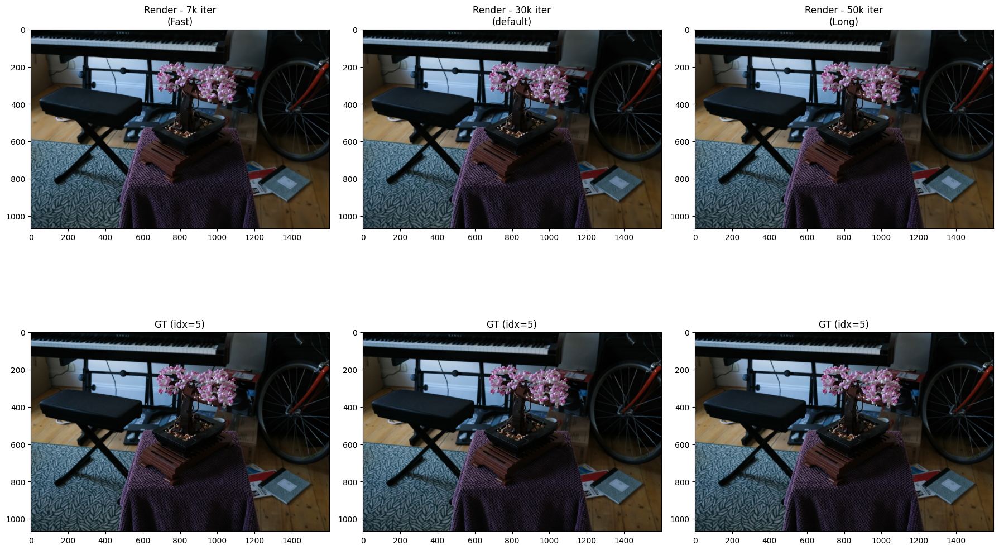

Saved: /content/drive/MyDrive/3dgs_output/bonsai/iter_comparison_idx10.png


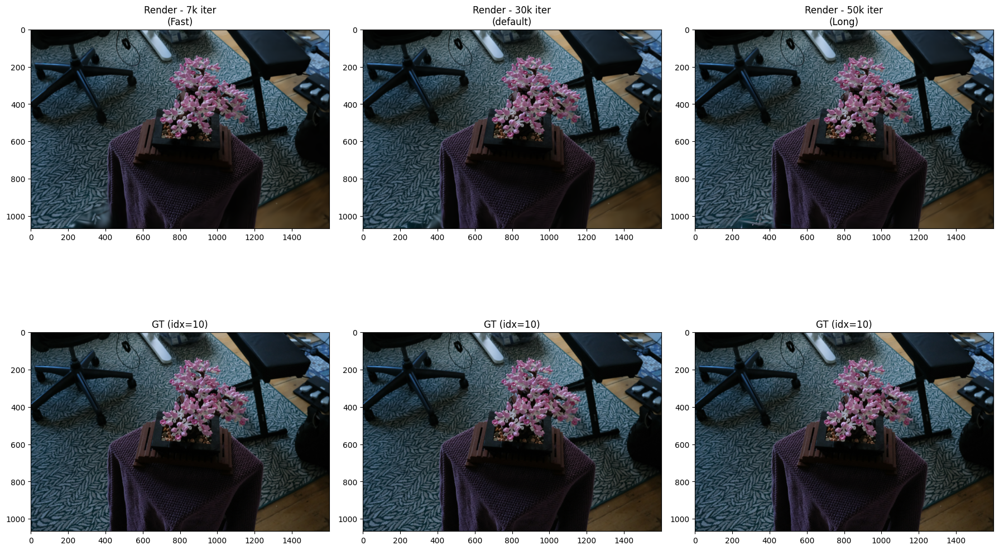

Saved: /content/drive/MyDrive/3dgs_output/bonsai/iter_comparison_idx15.png


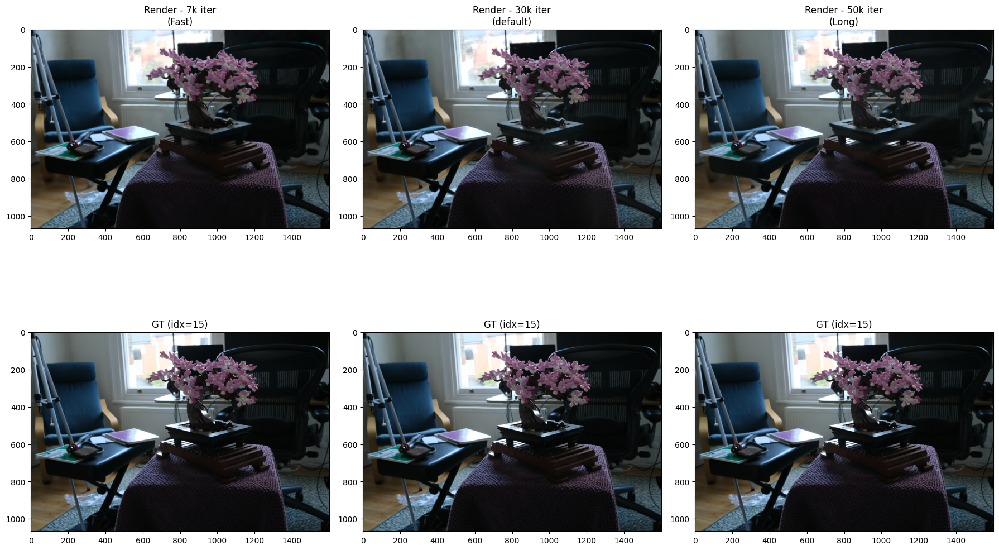

In [70]:
def compare_iter(base, idx=0):
    configs = [
        ("iter7k",  7000),
        ("iter30k", 30000),
        ("iter50k", 50000),
    ]
    labels = ["7k iter\n(Fast)", "30k iter\n(default)", "50k iter\n(Long)"]

    fig, axes = plt.subplots(2, 3, figsize=(18, 12))

    for i, ((cfg, iteration), label) in enumerate(zip(configs, labels)):
        model_path = f"{base}/{cfg}"
        render_dir = f"{model_path}/test/ours_{iteration}/renders"
        gt_dir     = f"{model_path}/test/ours_{iteration}/gt"

        renders = sorted(os.listdir(render_dir))
        gts     = sorted(os.listdir(gt_dir))

        axes[0][i].imshow(Image.open(f"{render_dir}/{renders[idx]}"))
        axes[0][i].set_title(f"Render - {label}")
        axes[1][i].imshow(Image.open(f"{gt_dir}/{gts[idx]}"))
        axes[1][i].set_title(f"GT (idx={idx})")

    plt.tight_layout()
    save_path = f"/content/drive/MyDrive/3dgs_output/bonsai/iter_comparison_idx{idx:02d}.png"
    plt.savefig(save_path, dpi=150, bbox_inches='tight')
    print(f"Saved: {save_path}")
    plt.show()

base = "/content/drive/MyDrive/3dgs_output/bonsai"
for idx in [5, 10, 15]:
    compare_iter(base, idx)

### Iteration Tets
- More Iteration on Training? could give a better results or not

### Metric Description

### Results
| Densification | SSIM | PNSR | LPIPS
|----------|----------|----------|----------|
| 7k       | 0.9323797 | 30.5002346 | 0.2045038 |
| 30k      | 0.9468836 | 32.3352585 | 0.1800254 |
| 50k      | 0.9468449 | 32.6032143 | 0.1798774 |